# 1. Data Acquisition
1.1 import Basic Libraries

1.2 Load the datasets

In [ ]:
# import Libraries
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import re
import string
import nltk
import spacy
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from textblob import Word
from nltk.stem import PorterStemmer
from nltk.stem import WordNetLemmatizer
from wordcloud import WordCloud


import warnings
warnings.filterwarnings("ignore")

In [ ]:
from google.colab import files
upload = files.upload()

Saving hotel_reviews.xlsx to hotel_reviews.xlsx


In [ ]:
reviews=pd.read_excel('hotel_reviews.xlsx')

# 2. Exploratory Data Analysis (EDA)
2.1 Data Exploration

2.2 Checking duplicates & null values

2.3 Removing Unwanted features

After examining "@", we came to the conclusion that this columns is not useful in our Modelling. We will drop those column.
2.4 Checking the data with different aspects before preprocessing it.

In [ ]:
reviews = pd.read_excel("hotel_reviews.xlsx")
reviews.drop(columns={'@'},inplace=True)
print("the shape of this dataset is :",reviews.shape)
reviews.sample(5)

the shape of this dataset is : (20491, 2)


,Review,Rating
16759,book read ok im gon na break make decision fir...,2
7748,"hotel excellent, hotel excellent, not hotel le...",5
8841,"not ounce fresh air, flight attendant fly ams ...",1
18638,great week majestic majestic punt cana6 13 jan...,4
14379,excellent value centrally located hotel stayed...,5


In [ ]:
reviews.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20491 entries, 0 to 20490
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   Review  20491 non-null  object
 1   Rating  20491 non-null  int64 
dtypes: int64(1), object(1)
memory usage: 320.3+ KB


In [ ]:
reviews.duplicated().sum()

0

In [ ]:
reviews.nunique()

Review    20491
Rating        5
dtype: int64

In [ ]:
reviews.isna().sum()

Review    0
Rating    0
dtype: int64

In [ ]:
reviews["Rating"].value_counts()

5    9054
4    6039
3    2184
2    1793
1    1421
Name: Rating, dtype: int64

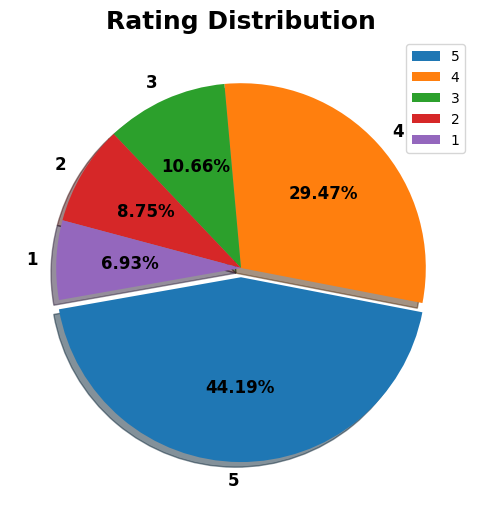

In [ ]:
#plotting the ratings
plt.figure(figsize = (10,6))
plt.pie(reviews['Rating'].value_counts(),
       labels=reviews['Rating'].value_counts().index,
       explode = [0.05, 0, 0, 0, 0],
       autopct= '%.2f%%',
       shadow= True,
       startangle= 190,
       textprops = {'size':'large','fontweight':'bold',
                    'rotation':'horizontal','color':'black'})
plt.legend(loc= 'upper right')
plt.title("Rating Distribution", fontsize = 18, fontweight = 'bold')
plt.show()

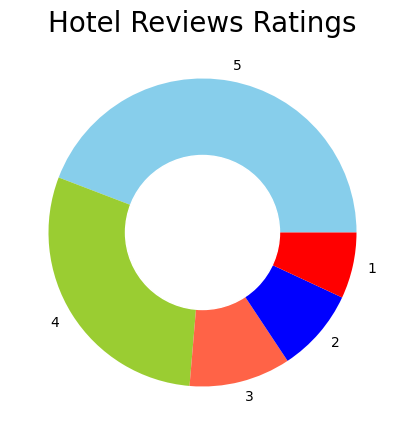

In [ ]:
ratings = reviews["Rating"].value_counts()
numbers = ratings.index
quantity = ratings.values

custom_colors = ["skyblue", "yellowgreen", 'tomato', "blue", "red"]
plt.figure(figsize=(5, 5))
plt.pie(quantity, labels=numbers, colors=custom_colors)
central_circle = plt.Circle((0, 0), 0.5, color='white')
fig = plt.gcf()
fig.gca().add_artist(central_circle)
plt.rc('font', size=12)
plt.title("Hotel Reviews Ratings", fontsize=20)
plt.show()

In [ ]:
import plotly.express as px
reviews['text_length'] = reviews.Review.str.len()

fig = px.histogram(reviews,
                   x='text_length',
                   color='Rating',
                   color_discrete_sequence=["#B6E880", "#FFA15A", "#FECB52", "#00CC96", "#EF553B"],
                   title="Review Length Distributions"
                  )

fig.update_layout(
    autosize=False,
    width=800,
    height=500,
    margin=dict(l=0,r=0,b=0)
)

fig.show()

In [ ]:
# to check how many no. of words and no .of characters are there
reviews["word_count"] = reviews["Review"].apply(lambda x: len(str(x).split(" ")))
reviews[["Review","word_count"]].sample(5)

,Review,word_count
15208,mature opulence original seasons hotel singapo...,56
489,good weekend stay wife stay quite regularly vi...,57
3860,"fabulous time natura park, husband just return...",327
14853,"great location stayed hotel luxer night, great...",53
16283,"great hotel, totally ignore previous review, n...",105


In [ ]:
# check no of upper case words
reviews['upper'] = reviews['Review'].apply(lambda x: len([x for x in x.split() if x.isupper()]))
reviews[['Review','upper']].head()

,Review,upper
0,nice hotel expensive parking got good deal sta...,0
1,ok nothing special charge diamond member hilto...,0
2,nice rooms not 4* experience hotel monaco seat...,0
3,"unique, great stay, wonderful time hotel monac...",0
4,"great stay great stay, went seahawk game aweso...",0


In [ ]:
# average word per sentences
def avg_word(sentences):
    words = str(sentences).split()
    return (sum(len(word) for word in words)/ len(words))

reviews["avg_words"] = reviews["Review"].apply(lambda x: avg_word(x))
reviews[["Review","avg_words"]].head()

,Review,avg_words
0,nice hotel expensive parking got good deal sta...,5.804598
1,ok nothing special charge diamond member hilto...,5.752000
2,nice rooms not 4* experience hotel monaco seat...,5.571429
3,"unique, great stay, wonderful time hotel monac...",5.730337
4,"great stay great stay, went seahawk game aweso...",5.701571


In [ ]:
# find the special characters using regular exp. module
import re

def spl_char(sentences):
  spl_char_letter = re.compile(r'[^a-zA-Z\s]')
  words = spl_char_letter.findall(sentences)
  return len(words)

reviews['spl_char'] = reviews['Review'].apply(lambda x: spl_char(x))
reviews[['Review','spl_char']].head()

,Review,spl_char
0,nice hotel expensive parking got good deal sta...,14
1,ok nothing special charge diamond member hilto...,39
2,nice rooms not 4* experience hotel monaco seat...,56
3,"unique, great stay, wonderful time hotel monac...",17
4,"great stay great stay, went seahawk game aweso...",42


In [ ]:
d1=reviews.copy()

# Ensuring 'Review' column is in string format
d1['Review'] = d1['Review'].astype(str)

# Filter rows that contain ".com"
pattern_matches = d1[d1['Review'].str.contains(r'\b\w+\.com\b')]

# Print the result
print(pattern_matches['Review'])

204      posh hotel husband stayed hilton seattle septe...
336      airport quality westin downtown price stayed w...
394      great atmosphere stay w seattle football games...
498      great airport hotel prepaid rate hilton.com 84...
506      nice hotel minor issues travelling friend stay...
                               ...                        
20098    sick breezes stayed breezes resort punta cana ...
20111    concerns not warranted breezes 25 years old ju...
20234    nice place heart entertainment disctrict just ...
20323    terrible service called hotel change reservati...
20431    perfect birthday getaway boyfriend surprised b...
Name: Review, Length: 293, dtype: object


In [ ]:
# Assuming pattern_matches is the DataFrame with rows containing ".com"
all_names = []

for index, row in pattern_matches.iterrows():
    review_text = row['Review']
    words_with_com = re.findall(r'\b\w+\.com\b', review_text)
    if words_with_com:
        all_names.extend(words_with_com)

# List of email service names to be excluded
email_services = [
    'yahoo.com', 'gmail.com', 'aol.com', 'hotmail.com', 'msn.com', 'mac.com', 'rr.com', 'netcom.com', 'excite.com',
    'rogers.com', 'canada.com', 'wmconnect.com', 'ntlworld.com', 'milwpc.com', 'weather.com']

# Filter out email service names from all_names
filtered_names = [name for name in all_names if name not in email_services]

filtered = list(filtered_names)
filtered

['hotwire.com',
 'priceline.com',
 'sneakysunday.com',
 'hilton.com',
 'hiexpress.com',
 'bookit.com',
 'minute.com',
 'hotel.com',
 'hotel.com',
 'fairmont.com',
 'bookit.com',
 'flickr.com',
 'hotels.com',
 'venere.com',
 'hotels.com',
 'tripadvisor.com',
 'tripadvisor.com',
 'otel.com',
 'hotwire.com',
 'tripadvisor.com',
 'tripadvisor.com',
 'tripadvisor.com',
 'hotels.com',
 'hotels.com',
 'advisor.com',
 'hotels.com',
 'hotels.com',
 'travelocity.com',
 'hotels.com',
 'veryveggie.com',
 'priceline.com',
 'cheapcaribbean.com',
 'clusters.com',
 'selloffvacations.com',
 'solmelia.com',
 'tripadvisor.com',
 'solmelia.com',
 'vacationkids.com',
 'priceline.com',
 'hotels.com',
 'intecontinental.com',
 'acampapr.com',
 'baravorunners.com',
 'cheepoair.com',
 'hotelmilanopr.com',
 'tripadvisor.com',
 'booking.com',
 'expedia.com',
 'hotels.com',
 '1800hotels.com',
 'hrs.com',
 'hotelsclick.com',
 'roomsnet.com',
 'otel.com',
 'hotel.com',
 'hotelsrus.com',
 'hotels.com',
 'tripadvisor.

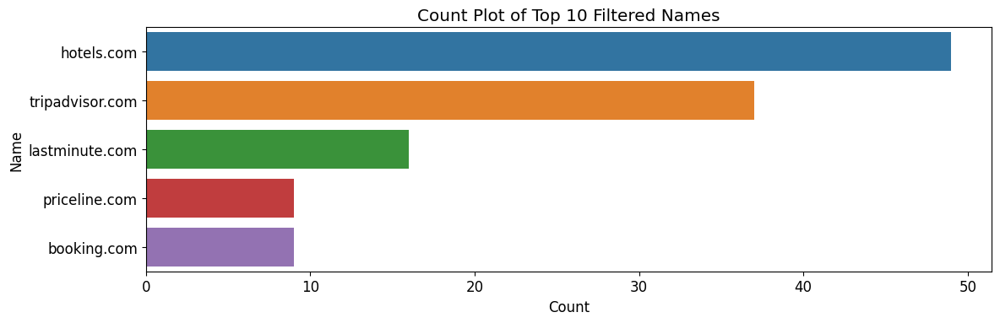

In [ ]:
name_counts = pd.Series(filtered).value_counts()

top_5_names = name_counts.head(5).index

# Filter only the top 5 names
filtered_names_top_5 = [name for name in filtered_names if name in top_5_names]

plt.figure(figsize=(12, 4))
sns.countplot(y=filtered_names_top_5, order=pd.Series(filtered_names_top_5).value_counts().index)

plt.title('Count Plot of Top 5 Filtered Names')
plt.xlabel('Count')
plt.ylabel('Name')
plt.tight_layout()
plt.show()

>These are the top 5 domains associated with the websites that provide hotel booking services.

In [ ]:
# find the punctuations using string modules
import re
import string

def count_punct(sentence):
  punct_chars = string.punctuation
  punct_letter = re.compile(f'[{re.escape(punct_chars)}]')
  punctuations = punct_letter.findall(sentence)
  return len(punctuations)

reviews['punctuations'] = reviews['Review'].apply(lambda x: count_punct(x))
reviews[['Review','punctuations']].head()

,Review,punctuations
0,nice hotel expensive parking got good deal sta...,12
1,ok nothing special charge diamond member hilto...,26
2,nice rooms not 4* experience hotel monaco seat...,32
3,"unique, great stay, wonderful time hotel monac...",16
4,"great stay great stay, went seahawk game aweso...",40


In [ ]:
import nltk
nltk.download('stopwords')
from nltk.corpus import stopwords
stop = set(stopwords.words('english'))
stop.discard('not')  # Remove 'not' from the stopwords set

reviews['stopwords'] = reviews['Review'].apply(lambda x: len([word for word in x.split() if word in stop]))
reviews[['Review', 'stopwords']].head()

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


,Review,stopwords
0,nice hotel expensive parking got good deal sta...,4
1,ok nothing special charge diamond member hilto...,6
2,nice rooms not 4* experience hotel monaco seat...,4
3,"unique, great stay, wonderful time hotel monac...",3
4,"great stay great stay, went seahawk game aweso...",9


In [ ]:
# no. of links attached to the review
reviews["Review"].str.contains('https://').value_counts()

False    20491
Name: Review, dtype: int64

In [ ]:

reviews["Review"].str.contains("www.").value_counts()

False    20459
True        32
Name: Review, dtype: int64

In [ ]:
reviews["Review"].str.contains(".com").value_counts()

True     14237
False     6254
Name: Review, dtype: int64

In [ ]:
reviews["Review"].str.contains("it__Ç_é_").value_counts()

False    20303
True       188
Name: Review, dtype: int64

In [ ]:
reviews["Review"].str.contains("__Ç_éÈe").value_counts()    # review index 1045

False    20404
True        87
Name: Review, dtype: int64

In [ ]:
# no. of usertags
reviews["Review"].str.contains('@').value_counts()

False    20491
Name: Review, dtype: int64

In [ ]:
# no. of hashtags
reviews["Review"].str.contains('#').value_counts()

False    20491
Name: Review, dtype: int64

In [ ]:
reviews.head()

,Review,Rating,text_length,word_count,upper,avg_words,spl_char,punctuations,stopwords
0,nice hotel expensive parking got good deal sta...,4,593,89,0,5.804598,14,12,4
1,ok nothing special charge diamond member hilto...,2,1689,252,0,5.752000,39,26,6
2,nice rooms not 4* experience hotel monaco seat...,3,1427,219,0,5.571429,56,32,4
3,"unique, great stay, wonderful time hotel monac...",5,600,91,0,5.730337,17,16,3
4,"great stay great stay, went seahawk game aweso...",5,1281,193,0,5.701571,42,40,9


In [ ]:
# Spelling correction
import spacy
nlp = spacy.load('en_core_web_sm')

reviews['Review'][:5].apply(lambda x: str(nlp(x)))

0    nice hotel expensive parking got good deal sta...
1    ok nothing special charge diamond member hilto...
2    nice rooms not 4* experience hotel monaco seat...
3    unique, great stay, wonderful time hotel monac...
4    great stay great stay, went seahawk game aweso...
Name: Review, dtype: object

In [ ]:
reviews.head()

,Review,Rating,text_length,word_count,upper,avg_words,spl_char,punctuations,stopwords
0,nice hotel expensive parking got good deal sta...,4,593,89,0,5.804598,14,12,4
1,ok nothing special charge diamond member hilto...,2,1689,252,0,5.752000,39,26,6
2,nice rooms not 4* experience hotel monaco seat...,3,1427,219,0,5.571429,56,32,4
3,"unique, great stay, wonderful time hotel monac...",5,600,91,0,5.730337,17,16,3
4,"great stay great stay, went seahawk game aweso...",5,1281,193,0,5.701571,42,40,9


In [ ]:
reviews.drop(["word_count","avg_words","spl_char","punctuations","stopwords","upper"], inplace=True, axis=1)

# 3. Text-PreProcessing
3.1 Cleaning data

There are a number of special characters and other values that needs to be removed. We will define a clean text function to remove it.
This function will convert all text to lower case
3.2 Removing Emojis

certain useless emojis will be added to data which should be removed custom emojis list.
3.3 Chat words abbrevation replacements

Short forms like IDK, WTF, FYI etc will be replaced with their abbrevations.
3.4 Tokenization

To breaks text into smaller parts for easier to remove stopwords, doing Stemming & Lemmatization.
3.6 Spell Checker

to check every spelling and correct it if it is wrong
3.7 StopWords

to eliminate words that are so widely used that they carry very little useful information.
3.8 Stemming

reducing a word to its word stem that suffixes or the roots
3.9 Lemmatization

lemmatization is to reduce a word to its root form

In [ ]:
# Data Pre-Processing
df = reviews[["Review"]]
df.head()

,Review
0,nice hotel expensive parking got good deal sta...
1,ok nothing special charge diamond member hilto...
2,nice rooms not 4* experience hotel monaco seat...
3,"unique, great stay, wonderful time hotel monac..."
4,"great stay great stay, went seahawk game aweso..."


In [ ]:
# convert to lower case and removing punctuations,lowercase, remove text in square brackets,remove links,remove punctuation and remove words containing numbers.
def clean_text(text):
    '''Make text lowercase, remove text in square brackets,remove links,remove punctuation
    and remove words containing numbers.'''
    text = text.lower()
    #text = re.sub('[^a-z]', '', text)
    text = re.sub('\[.*?\]', '', text)
    text = re.sub('https?://*', '', text)
    text = re.sub("\www.*", "", text)
    text = re.sub("\.com*", "", text)
    text = re.sub('<.*?>+', '', text)
    text = re.sub('[%s]' % re.escape(string.punctuation), '', text)
    text = re.sub('\n', '', text)
    text = re.sub('\w*\d\w*', '', text)
    return text

In [ ]:
df["Clean_Reviews"] = df["Review"].apply(lambda x: clean_text(x))
df.head()

,Review,Clean_Reviews
0,nice hotel expensive parking got good deal sta...,nice hotel expensive parking got good deal sta...
1,ok nothing special charge diamond member hilto...,ok nothing special charge diamond member hilto...
2,nice rooms not 4* experience hotel monaco seat...,nice rooms not experience hotel monaco seattl...
3,"unique, great stay, wonderful time hotel monac...",unique great stay wonderful time hotel monaco ...
4,"great stay great stay, went seahawk game aweso...",great stay great stay went seahawk game awesom...


In [ ]:
# Removing emojis
def remove_emoji(text):
    emoji_pattern = re.compile("["
                           u"\U0001F600-\U0001F64F"  # emoticons
                           u"\U0001F300-\U0001F5FF"  # symbols & pictographs
                           u"\U0001F680-\U0001F6FF"  # transport & map symbols
                           u"\U0001F1E0-\U0001F1FF"  # flags (iOS)
                           u"\U00002702-\U000027B0"
                           u"\U000024C2-\U0001F251"
                           "]+", flags=re.UNICODE)
    return emoji_pattern.sub(r'', text)

In [ ]:
df["Clean_Reviews"] = df["Clean_Reviews"].apply(lambda x: remove_emoji(x))
df.head()

,Review,Clean_Reviews
0,nice hotel expensive parking got good deal sta...,nice hotel expensive parking got good deal sta...
1,ok nothing special charge diamond member hilto...,ok nothing special charge diamond member hilto...
2,nice rooms not 4* experience hotel monaco seat...,nice rooms not experience hotel monaco seattl...
3,"unique, great stay, wonderful time hotel monac...",unique great stay wonderful time hotel monaco ...
4,"great stay great stay, went seahawk game aweso...",great stay great stay went seahawk game awesom...


In [ ]:
# Handling Chat word
'''
IDK = I Dont Know
ASAP = as soon as possible
FYI = For Your Information
FIMH = Forever in my heart
'''
chat_words = {  "AFAIK": "As Far As I Know", "AFK": "Away From Keyboard",
                "ASAP": "As Soon As Possible", "ATK":"At The Keyboard",
                "ATM": "At The Moment", "A3": "Anytime, Anywhere, Anyplace",
                "BAK": "Back At Keyboard" ,"BBL": "Be Back Later",
                "BBS":"Be Back Soon", "BFN":"Bye For Now",
                "B4N":"Bye For Now", "BRB":"Be Right Back",
                "BRT":"Be Right There", "BTW":"By The Way",
                "B4":"Before", "B4N":"Bye For Now",
                "CU":"See You", "CUL8R":"See You Later",
                "CYA":"See You", "FAQ":"Frequently Asked Questions",
                "FC":"Fingers Crossed", "FWIW":"For What It's Worth",
                "FYI":"For Your Information", "GAL":"Get A Life",
                "GG":"Good Game", "GN":"Good Night",
                "GMTA":"Great Minds Think Alike", "GR8":"Great",
                "G9":"Genius", "IC":"I See",
                "ICQ":"I Seek you", "ILU": "I Love You",
                "IMHO":"In My Honest Humble Opinion", "IMO":"In My Opinion",
                "IOW":"In Other Words" ,"IRL":"In Real Life",
                "KISS":"Keep It Simple Stupid", "LDR":"Long Distance Relationship",
                "LMAO":"Laugh My Ass Off", "LOL":"Laughing Out Loud",
                "LTNS":"Long Time No See", "L8R":"Later",
                "MTE":"My Thoughts Exactly", "M8":"Mate",
                "NRN":"No Reply Necessary",  "OIC":"Oh I See",
                "PITA":"Pain In The Ass", "PRT":"Party",
                "PRW":"Parents Are Watching", "ROFL":"Rolling On The Floor Laughing",
                "ROFLOL":"Rolling On The Floor Laughing Out Loud", "ROTFLMAO":"Rolling On The Floor Laughing My Ass Off",
                "SK8":"Skate", 'STATS':'Your sex and age',
                "ASL":"Age Sex Location",  "THNX":"Thank You",
                "TTFN":"TaTa For Now", "TTYL":"Talk To You Later",
                "U":"You", "U2":"You Too",
                "U4E":"Yours For Ever", "WB":"Welcome Back",
                "WTF":"What The Fuck", "WTG":"Way To Go",
                "WUF":"Where Are You From",  "W8":"Wait",
                "7K":"Sick Laughter",  "TFW" : "That feeling when",
                "MFW" : "My face when", "MRW" : "My reaction when",
                "IFYP" : "I feel your pain", "LOL" : "Laughing out loud",
                "TNTL" : "Trying not to laugh", "JK" : "Just kidding",
                "IDC" : "I dont care", "ILY" : "I love you",
                "IMU" : "I miss you", "ADIH" : "Another day in hell",
                "IDC" : "I dont care" ,"ZZZ" : "Sleeping bored tired",
                "WYWH" : "Wish you were here", "TIME" : "Tears in my eyes",
                "BAE" : "Before anyone else", "FIMH" : "Forever in my heart",
                "BSAAW" : "Big smile and a wink", "BWL" : "Bursting with laughter",
                "LMAO" : "Laughing my ass off", "BFF": "Best friends forever",
                "CSL" : "Cant stop laughing"}


chat_words_dict = pd.DataFrame.from_dict(chat_words, orient="index",columns=['full_form'])
chat_words_dict['short_form'] = chat_words_dict.index
chat_words = chat_words_dict.reset_index()
chat_words.drop(["index"], inplace=True, axis=1)

In [ ]:
chat_words.head()

,full_form,short_form
0,As Far As I Know,AFAIK
1,Away From Keyboard,AFK
2,As Soon As Possible,ASAP
3,At The Keyboard,ATK
4,At The Moment,ATM


In [ ]:
def chat_conversion(text):
  new_text=[]
  for words in text.split():
    if words.upper() in chat_words['short_form']:
      new_text.append(chat_words[words["full_form"]])
    else:
      new_text.append(words)
  return " ".join(new_text)

In [ ]:
df["Clean_Reviews"] = df["Clean_Reviews"].apply(lambda x: chat_conversion(x))
df.head()

,Review,Clean_Reviews
0,nice hotel expensive parking got good deal sta...,nice hotel expensive parking got good deal sta...
1,ok nothing special charge diamond member hilto...,ok nothing special charge diamond member hilto...
2,nice rooms not 4* experience hotel monaco seat...,nice rooms not experience hotel monaco seattle...
3,"unique, great stay, wonderful time hotel monac...",unique great stay wonderful time hotel monaco ...
4,"great stay great stay, went seahawk game aweso...",great stay great stay went seahawk game awesom...


In [ ]:
review = [text.strip() for text in df.Clean_Reviews] # remove both the leading and the trailing characters
review = [text for text in review if text] # removes empty strings, because they are considered in Python as False
review[:2]

['nice hotel expensive parking got good deal stay hotel anniversary arrived late evening took advice previous reviews did valet parking check quick easy little disappointed nonexistent view room room clean nice size bed comfortable woke stiff neck high pillows not soundproof like heard music room night morning loud bangs doors opening closing hear people talking hallway maybe just noisy neighbors aveda bath products nice did not goldfish stay nice touch taken advantage staying longer location great walking distance shopping overall nice experience having pay parking night',
 'ok nothing special charge diamond member hilton decided chain shot anniversary seattle start booked suite paid extra website description not suite bedroom bathroom standard hotel room took printed reservation desk showed said things like tv couch ect desk clerk told oh mixed suites description kimpton website sorry free breakfast got kidding embassy suits sitting room bathroom bedroom unlike kimpton calls suite da

In [ ]:
# Joining the list into one string/text
review_text = ' '.join(review)
print(len(review_text))
print(review_text[0:150])

14220702
nice hotel expensive parking got good deal stay hotel anniversary arrived late evening took advice previous reviews did valet parking check quick easy


In [ ]:
# Tokenization
nltk.download('punkt')
import nltk

from nltk.tokenize import word_tokenize
review_tokens = word_tokenize(review_text)
print(review_tokens[0:50])

# for Clean_Reviews Column
df['Clean_Reviews'] = df['Clean_Reviews'].apply(lambda x: nltk.word_tokenize(x))
df.head(5)

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.


['nice', 'hotel', 'expensive', 'parking', 'got', 'good', 'deal', 'stay', 'hotel', 'anniversary', 'arrived', 'late', 'evening', 'took', 'advice', 'previous', 'reviews', 'did', 'valet', 'parking', 'check', 'quick', 'easy', 'little', 'disappointed', 'nonexistent', 'view', 'room', 'room', 'clean', 'nice', 'size', 'bed', 'comfortable', 'woke', 'stiff', 'neck', 'high', 'pillows', 'not', 'soundproof', 'like', 'heard', 'music', 'room', 'night', 'morning', 'loud', 'bangs', 'doors']


,Review,Clean_Reviews
0,nice hotel expensive parking got good deal sta...,"[nice, hotel, expensive, parking, got, good, d..."
1,ok nothing special charge diamond member hilto...,"[ok, nothing, special, charge, diamond, member..."
2,nice rooms not 4* experience hotel monaco seat...,"[nice, rooms, not, experience, hotel, monaco, ..."
3,"unique, great stay, wonderful time hotel monac...","[unique, great, stay, wonderful, time, hotel, ..."
4,"great stay great stay, went seahawk game aweso...","[great, stay, great, stay, went, seahawk, game..."


In [ ]:
nltk.download('stopwords')

from nltk.corpus import stopwords

# For wordCloud
my_stop_words = stopwords.words('english')
sw_list = ['\x92','rt','ye','yeah','haha','Yes','__Ç_éÈe','I','__Ç','__Ç_é_',"br/", "hotel", "room"]     # index 1044 emojis
my_stop_words.extend(sw_list)

no_stop_tokens = [word for word in review_tokens if not word in my_stop_words]

# For Clean_Reviews Column
my_stop_words=stopwords.words('english')
sw_list = ['\x92','rt','ye','yeah','haha','Yes','__Ç_éÈe','I','__Ç','__Ç_é_',"br/"]     # index 1044 emojis
my_stop_words.extend(sw_list)
stopwords_set = set(my_stop_words)
cleaned_tweets = []

for index, row in df.iterrows():

    # filerting out all the stopwords
    words_without_stopwords = [word for word in row.Clean_Reviews if not word in stopwords_set and '#' not in word.lower()]

    # finally creating tweets list of tuples containing stopwords(list) and sentimentType
    cleaned_tweets.append(words_without_stopwords)

df['Clean_Reviews'] = cleaned_tweets
df.head(10)

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


,Review,Clean_Reviews
0,nice hotel expensive parking got good deal sta...,"[nice, hotel, expensive, parking, got, good, d..."
1,ok nothing special charge diamond member hilto...,"[ok, nothing, special, charge, diamond, member..."
2,nice rooms not 4* experience hotel monaco seat...,"[nice, rooms, experience, hotel, monaco, seatt..."
3,"unique, great stay, wonderful time hotel monac...","[unique, great, stay, wonderful, time, hotel, ..."
4,"great stay great stay, went seahawk game aweso...","[great, stay, great, stay, went, seahawk, game..."
5,love monaco staff husband stayed hotel crazy w...,"[love, monaco, staff, husband, stayed, hotel, ..."
6,"cozy stay rainy city, husband spent 7 nights m...","[cozy, stay, rainy, city, husband, spent, nigh..."
7,"excellent staff, housekeeping quality hotel ch...","[excellent, staff, housekeeping, quality, hote..."
8,"hotel stayed hotel monaco cruise, rooms genero...","[hotel, stayed, hotel, monaco, cruise, rooms, ..."
9,excellent stayed hotel monaco past w/e delight...,"[excellent, stayed, hotel, monaco, past, delig..."


In [ ]:
# making the data lower case
lower_words = [text.lower() for text in no_stop_tokens]
print(lower_words[0:50])

['nice', 'expensive', 'parking', 'got', 'good', 'deal', 'stay', 'anniversary', 'arrived', 'late', 'evening', 'took', 'advice', 'previous', 'reviews', 'valet', 'parking', 'check', 'quick', 'easy', 'little', 'disappointed', 'nonexistent', 'view', 'clean', 'nice', 'size', 'bed', 'comfortable', 'woke', 'stiff', 'neck', 'high', 'pillows', 'soundproof', 'like', 'heard', 'music', 'night', 'morning', 'loud', 'bangs', 'doors', 'opening', 'closing', 'hear', 'people', 'talking', 'hallway', 'maybe']


In [ ]:
# Stemming
from nltk.stem import PorterStemmer
ps=PorterStemmer()

stemmed_tokens=[ps.stem(word) for word in lower_words]
# creating other Column
df['stemmed'] = df['Clean_Reviews'].apply(lambda x: " ".join([ps.stem(word) for word in x]))
df.head()

,Review,Clean_Reviews,stemmed
0,nice hotel expensive parking got good deal sta...,"[nice, hotel, expensive, parking, got, good, d...",nice hotel expens park got good deal stay hote...
1,ok nothing special charge diamond member hilto...,"[ok, nothing, special, charge, diamond, member...",ok noth special charg diamond member hilton de...
2,nice rooms not 4* experience hotel monaco seat...,"[nice, rooms, experience, hotel, monaco, seatt...",nice room experi hotel monaco seattl good hote...
3,"unique, great stay, wonderful time hotel monac...","[unique, great, stay, wonderful, time, hotel, ...",uniqu great stay wonder time hotel monaco loca...
4,"great stay great stay, went seahawk game aweso...","[great, stay, great, stay, went, seahawk, game...",great stay great stay went seahawk game awesom...


In [ ]:
# Lemmatization
nltk.download('wordnet')
from nltk.stem import WordNetLemmatizer

# Create an instance of WordNetLemmatizer
wnl = WordNetLemmatizer()


# nlp=spacy.load('en_core_web_sm')
# chunk_size = 1000  # Adjust the chunk size as needed
# chunks = [lower_words[i:i + chunk_size] for i in range(0, len(lower_words), chunk_size)]

# Lemmatize each chunk and flatten the results
# lemma_words = [token.lemma_ for chunk in chunks for token in nlp(' '.join(chunk))]
lemma_words=[wnl.lemmatize(word) for word in lower_words]
print(lemma_words[:50])

df['lemmas'] = df['Clean_Reviews'].apply(lambda x: " ".join([wnl.lemmatize(word) for word in x]))
df.head()

[nltk_data] Downloading package wordnet to /root/nltk_data...


['nice', 'expensive', 'parking', 'got', 'good', 'deal', 'stay', 'anniversary', 'arrived', 'late', 'evening', 'took', 'advice', 'previous', 'review', 'valet', 'parking', 'check', 'quick', 'easy', 'little', 'disappointed', 'nonexistent', 'view', 'clean', 'nice', 'size', 'bed', 'comfortable', 'woke', 'stiff', 'neck', 'high', 'pillow', 'soundproof', 'like', 'heard', 'music', 'night', 'morning', 'loud', 'bang', 'door', 'opening', 'closing', 'hear', 'people', 'talking', 'hallway', 'maybe']


,Review,Clean_Reviews,stemmed,lemmas
0,nice hotel expensive parking got good deal sta...,"[nice, hotel, expensive, parking, got, good, d...",nice hotel expens park got good deal stay hote...,nice hotel expensive parking got good deal sta...
1,ok nothing special charge diamond member hilto...,"[ok, nothing, special, charge, diamond, member...",ok noth special charg diamond member hilton de...,ok nothing special charge diamond member hilto...
2,nice rooms not 4* experience hotel monaco seat...,"[nice, rooms, experience, hotel, monaco, seatt...",nice room experi hotel monaco seattl good hote...,nice room experience hotel monaco seattle good...
3,"unique, great stay, wonderful time hotel monac...","[unique, great, stay, wonderful, time, hotel, ...",uniqu great stay wonder time hotel monaco loca...,unique great stay wonderful time hotel monaco ...
4,"great stay great stay, went seahawk game aweso...","[great, stay, great, stay, went, seahawk, game...",great stay great stay went seahawk game awesom...,great stay great stay went seahawk game awesom...


In [ ]:
clean_reviews=' '.join(lemma_words)
clean_reviews[:500]

'nice expensive parking got good deal stay anniversary arrived late evening took advice previous review valet parking check quick easy little disappointed nonexistent view clean nice size bed comfortable woke stiff neck high pillow soundproof like heard music night morning loud bang door opening closing hear people talking hallway maybe noisy neighbor aveda bath product nice goldfish stay nice touch taken advantage staying longer location great walking distance shopping overall nice experience pa'

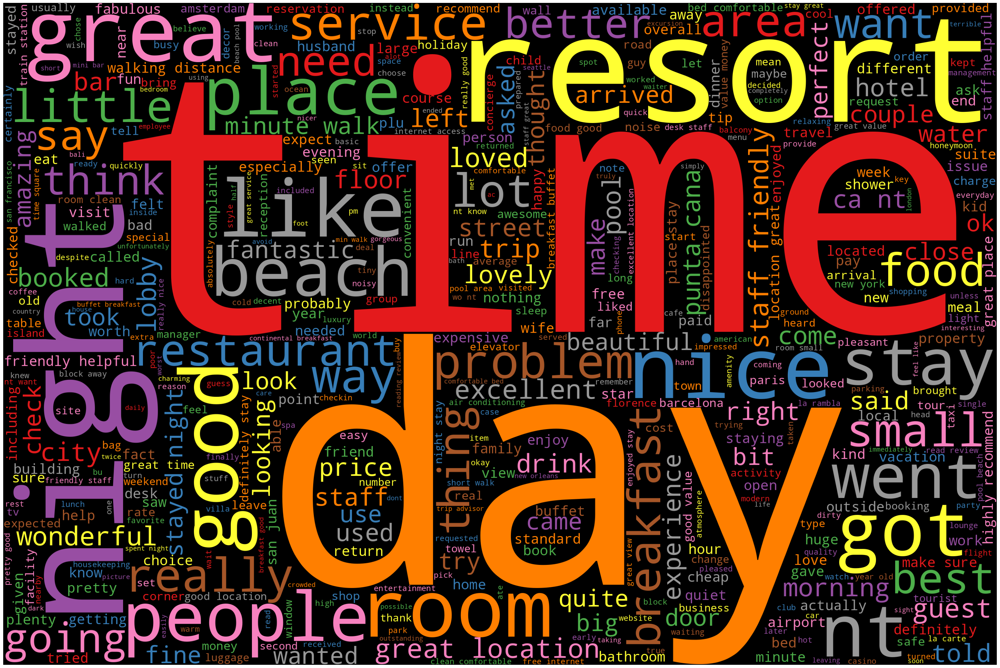

In [ ]:
from wordcloud import WordCloud

# Define a function to plot word cloud
def plot_cloud(wordcloud):
    plt.figure(figsize=(40,30))
    plt.imshow(wordcloud)
    plt.axis('off')


# Generate Word Cloud
wordcloud=WordCloud(width=3000,height=2000,background_color='black',max_words=500,
                     colormap='Set1',stopwords=my_stop_words).generate(clean_reviews)
plot_cloud(wordcloud)

In [ ]:
df.head()

,Review,Clean_Reviews,stemmed,lemmas
0,nice hotel expensive parking got good deal sta...,"[nice, hotel, expensive, parking, got, good, d...",nice hotel expens park got good deal stay hote...,nice hotel expensive parking got good deal sta...
1,ok nothing special charge diamond member hilto...,"[ok, nothing, special, charge, diamond, member...",ok noth special charg diamond member hilton de...,ok nothing special charge diamond member hilto...
2,nice rooms not 4* experience hotel monaco seat...,"[nice, rooms, experience, hotel, monaco, seatt...",nice room experi hotel monaco seattl good hote...,nice room experience hotel monaco seattle good...
3,"unique, great stay, wonderful time hotel monac...","[unique, great, stay, wonderful, time, hotel, ...",uniqu great stay wonder time hotel monaco loca...,unique great stay wonderful time hotel monaco ...
4,"great stay great stay, went seahawk game aweso...","[great, stay, great, stay, went, seahawk, game...",great stay great stay went seahawk game awesom...,great stay great stay went seahawk game awesom...


Text(0.5, 1.0, 'Distribution of Reviews: Business vs Trip')

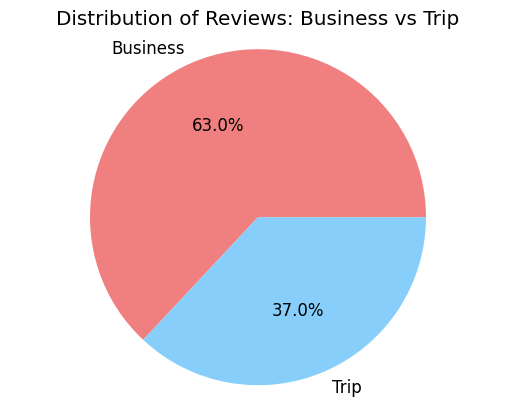

In [ ]:
business_keywords = ["business", "work", "meeting"]
trip_keywords = ["vacation", "holiday", "family trip"]

df['business_count'] = df['lemmas'].apply(lambda x: sum(1 for keyword in business_keywords if keyword in x))
df['trip_count'] = df['lemmas'].apply(lambda x: sum(1 for keyword in trip_keywords if keyword in x))

# Calculate percentages
total_reviews = len(df)
business_per = (df['business_count'].sum() / total_reviews) * 100
trip_per = (df['trip_count'].sum() / total_reviews) * 100

labels = ['Business', 'Trip']
sizes = [business_per,trip_per]
colors = ['lightcoral', 'lightskyblue']

plt.pie(sizes, labels=labels, colors=colors, autopct='%0.1f%%')
plt.axis('equal')  # Equal aspect ratio ensures the pie chart is circular.
plt.title('Distribution of Reviews: Business vs Trip')


> We see that majority of people tend to book the hotel for business purposes.

# Vadar Sentiment Analysis
**VADER** stands for Valence Aware Dictionary and sentiment Reasoner. It is a rule-based sentiment analyzer.It consists of a list of lexical features (e.g. words) which are generally labeled as per their semantic orientation as positive or negative.

In [ ]:
data=df.copy()
data.drop(columns={'Review','Clean_Reviews','stemmed'},inplace=True)

In [ ]:
data.sample(3)

,lemmas,business_count,trip_count
12108,wonderful add superlative truly great place st...,0,0
18136,venice time visit enjoyable staying pretty hot...,0,0
10023,happy hotel langlois wife stayed hotel langloi...,0,0


In [ ]:
from nltk.sentiment.vader import SentimentIntensityAnalyzer
# from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer

In [ ]:
# analyser = SentimentIntensityAnalyzer()

In [115]:
import nltk
nltk.download('vader_lexicon')

pos_words_for_pos_group = []
neg_words_for_pos_group = []
net_words_for_pos_group = []

def classify_words(text):
    analyzer = SentimentIntensityAnalyzer()
    words = text.split()
    for word in words:
        score = analyzer.polarity_scores(word)['compound']
        if score > 0.5:
            pos_words_for_pos_group.append(word)
        elif ((score < 0.5) & (score > -0.5)):
            net_words_for_pos_group.append(word)
        else:
          neg_words_for_pos_group.append(word)


data["lemmas"].apply(lambda x: classify_words(x))

[nltk_data] Downloading package vader_lexicon to /root/nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


0        None
1        None
2        None
3        None
4        None
         ... 
20486    None
20487    None
20488    None
20489    None
20490    None
Name: lemmas, Length: 20491, dtype: object

Positive Word Extraction

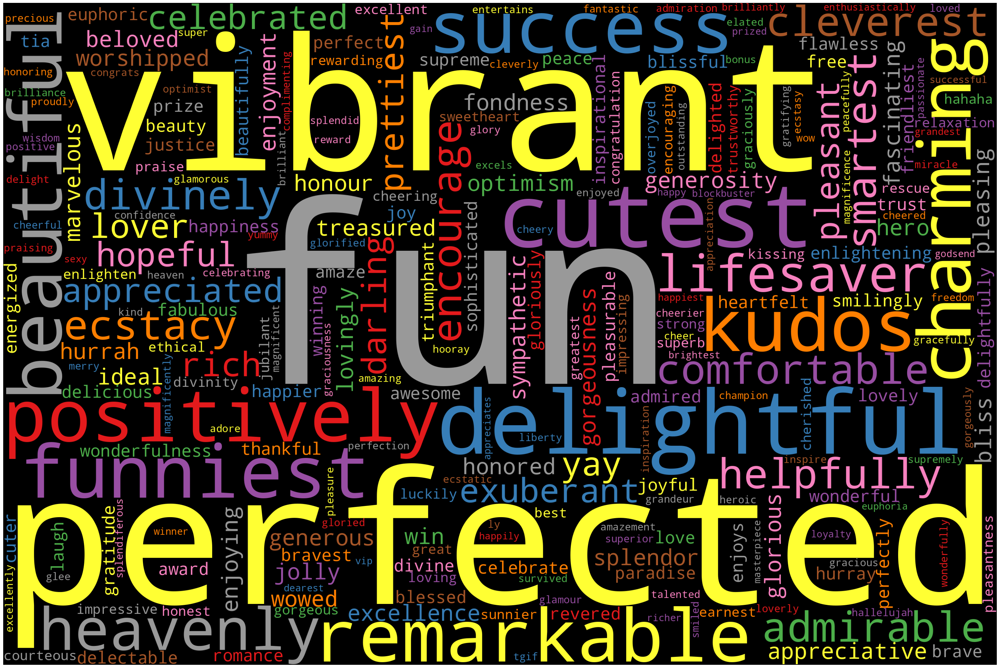

In [114]:
# Define a function to plot word cloud
pw = set(pos_words_for_pos_group)
pos_words_for_wc = ' '.join(pw)

def plot_cloud(wordcloud):
    plt.figure(figsize=(40,30))
    plt.imshow(wordcloud)
    plt.axis('off')

# Generate Positive WordCloud
wordcloud=WordCloud(width=3000,height=2000,background_color='black',max_words=500,
                     colormap='Set1',stopwords=my_stop_words).generate(pos_words_for_wc  )
plot_cloud(wordcloud)

Neutral word Extraction

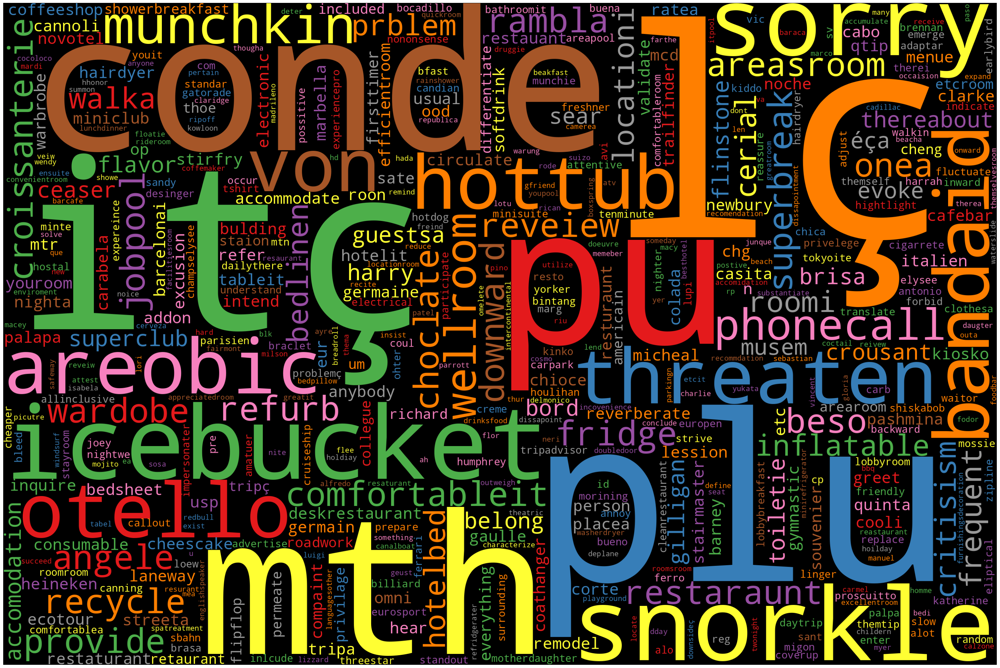

In [117]:
# Define a function to plot word cloud
neu_word = set(net_words_for_pos_group)
neg_words_for_wc = ' '.join(neu_word)

def plot_cloud(wordcloud):
    plt.figure(figsize=(40,30))
    plt.imshow(wordcloud)
    plt.axis('off')


# Generate Negative Word Cloud
wordcloud=WordCloud(width=3000,height=2000,background_color='black',max_words=500,
                     colormap='Set1',stopwords=my_stop_words).generate(neg_words_for_wc)
plot_cloud(wordcloud)

#### Negative word extraction

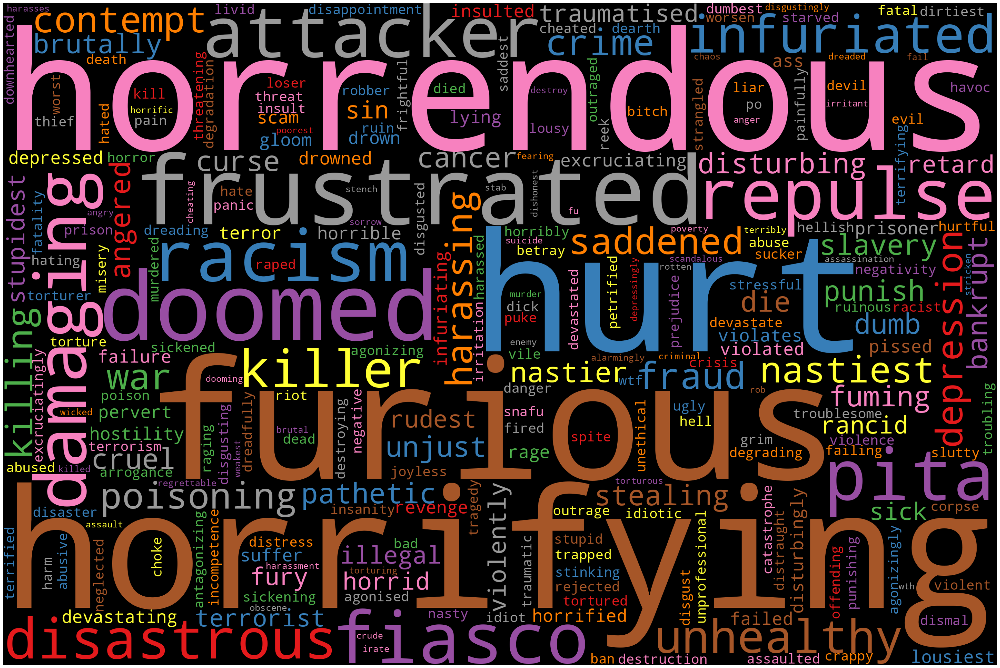

In [116]:
# Define a function to plot word cloud
nw = set(neg_words_for_pos_group)
neg_words_for_wc = ' '.join(nw)

def plot_cloud(wordcloud):
    plt.figure(figsize=(40,30))
    plt.imshow(wordcloud)
    plt.axis('off')


# Generate Negative Word Cloud
wordcloud=WordCloud(width=3000,height=2000,background_color='black',max_words=500,
                     colormap='Set1',stopwords=my_stop_words).generate(neg_words_for_wc)
plot_cloud(wordcloud)

# Word2Vec

In [ ]:
# Word2Vec
import gensim
from gensim.utils import simple_preprocess

In [ ]:
story = []
for i in data["lemmas"]:
  story.append(simple_preprocess(i))

In [ ]:
print(len(story))   # in story there are 20491 sentences and every sentences are tokenize

story

20491


[['nice',
  'hotel',
  'expensive',
  'parking',
  'got',
  'good',
  'deal',
  'stay',
  'hotel',
  'anniversary',
  'arrived',
  'late',
  'evening',
  'took',
  'advice',
  'previous',
  'review',
  'valet',
  'parking',
  'check',
  'quick',
  'easy',
  'little',
  'disappointed',
  'nonexistent',
  'view',
  'room',
  'room',
  'clean',
  'nice',
  'size',
  'bed',
  'comfortable',
  'woke',
  'stiff',
  'neck',
  'high',
  'pillow',
  'soundproof',
  'like',
  'heard',
  'music',
  'room',
  'night',
  'morning',
  'loud',
  'bang',
  'door',
  'opening',
  'closing',
  'hear',
  'people',
  'talking',
  'hallway',
  'maybe',
  'noisy',
  'neighbor',
  'aveda',
  'bath',
  'product',
  'nice',
  'goldfish',
  'stay',
  'nice',
  'touch',
  'taken',
  'advantage',
  'staying',
  'longer',
  'location',
  'great',
  'walking',
  'distance',
  'shopping',
  'overall',
  'nice',
  'experience',
  'pay',
  'parking',
  'night'],
 ['ok',
  'nothing',
  'special',
  'charge',
  'diamond

In [ ]:
cbow_model = gensim.models.Word2Vec(
    story,
    window = 10,                # it means when we predict the centre word how much words will we keep on other side
    min_count = 2,             # we will take only those words min count is more than or equal to 2
    vector_size = 100,         # how many vec are needed in output
    sg = 0
    )

In [ ]:
print(cbow_model)

Word2Vec<vocab=26311, vector_size=100, alpha=0.025>


In [ ]:
cbow_model.build_vocab(story)

In [ ]:
cbow_model.train(story, total_examples=cbow_model.corpus_count, epochs=10)

(17460885, 19906350)

In [ ]:
cbow_model.wv.get_normed_vectors().shape

(26311, 100)

In [ ]:
cbow_model.wv.most_similar("dirty")

[('disgusting', 0.7885277271270752),
 ('stain', 0.7396077513694763),
 ('filthy', 0.7390103936195374),
 ('smelly', 0.7282396554946899),
 ('mold', 0.7222919464111328),
 ('badly', 0.7192913293838501),
 ('carpet', 0.719092071056366),
 ('stained', 0.717315673828125),
 ('cracked', 0.7143802046775818),
 ('paint', 0.6959249377250671)]

In [ ]:
cbow_model.wv.most_similar("wonderful")

[('fabulous', 0.7647399306297302),
 ('amazing', 0.6783632636070251),
 ('loved', 0.6664755344390869),
 ('incredible', 0.6607759594917297),
 ('great', 0.6461856961250305),
 ('fantastic', 0.6406118273735046),
 ('terrific', 0.6322962641716003),
 ('perfect', 0.6269246339797974),
 ('lovely', 0.5634713172912598),
 ('awesome', 0.5508010387420654)]

In [ ]:
cbow_model.wv.most_similar("room")

[('roomthe', 0.5869063138961792),
 ('balcony', 0.5470401048660278),
 ('twin', 0.5303645133972168),
 ('bed', 0.5279017090797424),
 ('floor', 0.5261162519454956),
 ('bathroom', 0.525073230266571),
 ('double', 0.5038509964942932),
 ('requested', 0.5017700791358948),
 ('closet', 0.4977535903453827),
 ('superior', 0.49610722064971924)]

In [ ]:
# people travelling for a busiess
cbow_model.wv.most_similar(positive=["business"])

[('leisure', 0.6050333976745605),
 ('frequent', 0.5672080516815186),
 ('convention', 0.5662137866020203),
 ('tutu', 0.5165873169898987),
 ('wellness', 0.4986128807067871),
 ('conference', 0.4980918765068054),
 ('dallas', 0.47714316844940186),
 ('financial', 0.46948421001434326),
 ('eaton', 0.4580047130584717),
 ('meeting', 0.4478782117366791)]

In [ ]:
# people for holidays
cbow_model.wv.most_similar(positive=["holiday", "travel","room"], negative=[], topn=10)

[('thomson', 0.48693326115608215),
 ('knowing', 0.4416854679584503),
 ('travelling', 0.43255722522735596),
 ('unsure', 0.41340407729148865),
 ('twin', 0.41037294268608093),
 ('fully', 0.3981902599334717),
 ('travelled', 0.3943619430065155),
 ('thompson', 0.3932202160358429),
 ('accommodation', 0.387405663728714),
 ('vacation', 0.3787273168563843)]

In [ ]:
cbow_model.wv.most_similar(positive=["room", "dirty", "disappoint", "suffered", "noise", "unsanitary"], negative=[], topn=10)

[('dust', 0.7037420272827148),
 ('mold', 0.6948806643486023),
 ('badly', 0.6936070919036865),
 ('cracked', 0.6884739995002747),
 ('plumbing', 0.6811200976371765),
 ('smelly', 0.6679386496543884),
 ('cockroach', 0.6469756364822388),
 ('growing', 0.6423245668411255),
 ('stain', 0.6388871669769287),
 ('mouldy', 0.626086413860321)]

In [ ]:
cbow_model.wv.most_similar(positive=["frontdesk","employee", "polite", "cooperative"], negative=[], topn=10)

[('genuinely', 0.7211183309555054),
 ('greeting', 0.6817154884338379),
 ('engaging', 0.6663821339607239),
 ('eager', 0.6580843925476074),
 ('efficent', 0.6515553593635559),
 ('knowledgable', 0.6412218809127808),
 ('trained', 0.6342361569404602),
 ('responsive', 0.6335631012916565),
 ('ruben', 0.6307539939880371),
 ('helping', 0.6279869079589844)]

In [ ]:
a = cbow_model.wv.get_vector("employee") + cbow_model.wv.get_vector("polite") + cbow_model.wv.get_vector("cooperative")
cbow_model.wv.cosine_similarities(a, [cbow_model.wv.get_vector("frontdesk")])

array([0.46779147], dtype=float32)

In [ ]:
cbow_model.wv.most_similar(positive=["valuable","stole","belonging","purse","lost"], negative=[], topn=10)

[('stolen', 0.8692452907562256),
 ('wallet', 0.8396357893943787),
 ('passport', 0.8385381102561951),
 ('theft', 0.7132754325866699),
 ('belt', 0.6963099241256714),
 ('camera', 0.6785634756088257),
 ('deposit', 0.6771609783172607),
 ('locked', 0.6741241216659546),
 ('attacked', 0.6739973425865173),
 ('thief', 0.6685813665390015)]

In [ ]:
cbow_model.wv.most_similar(positive=["valuable","stole","belonging","purse",], negative=["lost"], topn=10)

[('stolen', 0.7906696200370789),
 ('wallet', 0.7484083771705627),
 ('passport', 0.7338534593582153),
 ('locked', 0.6741406321525574),
 ('theft', 0.663449764251709),
 ('belt', 0.6501904726028442),
 ('bolt', 0.6391847729682922),
 ('clothes', 0.636773943901062),
 ('handbag', 0.6170146465301514),
 ('guard', 0.6143635511398315)]

In [ ]:
cbow_model.wv.most_similar(positive=["disgusting","service","customer","horrible"], negative=[], topn=10)

[('terrible', 0.7007042765617371),
 ('awful', 0.6622989773750305),
 ('inconsistent', 0.6256554126739502),
 ('worst', 0.6080940961837769),
 ('poor', 0.5923575758934021),
 ('worse', 0.5867276191711426),
 ('horrific', 0.5735428333282471),
 ('unhelpful', 0.5520053505897522),
 ('clearly', 0.5505167841911316),
 ('inefficient', 0.5483571887016296)]

In [118]:
b = cbow_model.wv.get_vector("horrible") + cbow_model.wv.get_vector("customer") + cbow_model.wv.get_vector("service")
cbow_model.wv.cosine_similarities(b, [cbow_model.wv.get_vector("management")])

array([0.567215], dtype=float32)

In [ ]:
cbow_model.wv.similarity("parking", "lost")

In [ ]:
cbow_model.wv.similarity("clean", "room")